<a href="https://colab.research.google.com/github/anvithakp/ML-Google-Colab/blob/master/Anvitha_014503593_Confusion_Matrix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Introduction**
In this colab I will use confusion matrix of various predictive classifier models using muller loop to see how accurate they are in detecting whether a person is a diabetic or a non-diabetic. 

## **Data** **Narrative**

The dataset consists of several medical predictor variables and one target variable, Diabetic. Predictor variables includes the number of pregnancies the patient has had, their BMI, insulin level, age, plasmaGlucose and so on.

## **Steps Followed**

*   Perform Muller Loop on differently skewed distrubutions of data and generate confusion matrix 
*   Calculate F1 , AUC-ROC curve
*   Perform Muller Loop after balancing the class distributions and generate confusion matrix
*   Use Holoviz Dashboard for visualizing the confusion matrix.
*   Compare and Contrast the results

## **Goal Achieved**

By performing and classification on different data distributions and class distributions, I tried to develop a model to minimize the False Positives in the model, Hence in real-world application, A patient can be informed of the possible diabetic condition, rather than a False Negative outcome where is patient is misinformed about his diabetic condition.



Comparision of Evaluation Metrics with Different Distributions

Top Performing Model  | F1 Score | Accuracy | Distribution Type | TP | TN | FP | FN |
-- | -- | -- | -- | -- | -- | -- | -- |
XGBoost and AdaBoost| 0.95 | 95.07 | Unbalanced Classes and Data | 1969 | 878 | 75 | 78 |
XGBoost | 0.95 | 95.23 | Right Skewed Data | 1918 | 923 | 80 | 79 |
XGBoost | 0.95 | 95.53 | Left Skewed Data | 1958 | 884 | 71 | 87 |
XGBoost | 0.95 | 95.33 | Imbalanced Class , Balanced Data Distribution | 2831 | 2889 | 129 | 151 |
XGBoost | 1.00| 100.00 | Balanced Class and Data Distributions | 2003 | 1997 | 0 | 0 |

## **What is the need for Class Balancing:**

**Overfitting:** Our classification models will assume that in most cases there are no diabetic condition! What we want for our model is to be certain when a person is diabetic.

**Wrong Correlations:** It will be useful to understand how each of this features influence the result by having an imbalance dataframe we will not able to see the true correlations between the class and features

### Standard Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import itertools
from sklearn.metrics import roc_curve, auc

### Importing the Dataset

In [ ]:
data_link = 'https://raw.githubusercontent.com/anvithakp/AlternusVera/main/dataset/diabetes.csv'

diabetes_df = pd.read_csv(data_link)
diabetes_df.head()

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,1354778,0,171,80,34,23,43.509726,1.213191,21,0
1,1147438,8,92,93,47,36,21.240576,0.158365,23,0
2,1640031,7,115,47,52,35,41.511523,0.079019,23,0
3,1883350,9,103,78,25,304,29.582192,1.282870,43,1
4,1424119,1,85,59,27,35,42.604536,0.549542,22,0


In [ ]:
diabetes_df.describe()

,PatientID,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
count,1.500000e+04,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,1.502922e+06,3.224533,107.856867,71.220667,28.814000,137.852133,31.509646,0.398968,30.137733,0.333333
std,2.892534e+05,3.391020,31.981975,16.758716,14.555716,133.068252,9.759000,0.377944,12.089703,0.471420
min,1.000038e+06,0.000000,44.000000,24.000000,7.000000,14.000000,18.200512,0.078044,21.000000,0.000000
25%,1.252866e+06,0.000000,84.000000,58.000000,15.000000,39.000000,21.259887,0.137743,22.000000,0.000000
50%,1.505508e+06,2.000000,104.000000,72.000000,31.000000,83.000000,31.767940,0.200297,24.000000,0.000000
75%,1.755205e+06,6.000000,129.000000,85.000000,41.000000,195.000000,39.259692,0.616285,35.000000,1.000000
max,1.999997e+06,14.000000,192.000000,117.000000,93.000000,799.000000,56.034628,2.301594,77.000000,1.000000


In [ ]:
diabetes_df.shape

(15000, 10)

### Checking for Null Values

In [ ]:
diabetes_df.isna().any()

PatientID                 False
Pregnancies               False
PlasmaGlucose             False
DiastolicBloodPressure    False
TricepsThickness          False
SerumInsulin              False
BMI                       False
DiabetesPedigree          False
Age                       False
Diabetic                  False
dtype: bool

In [ ]:
feature_matrix = diabetes_df.drop(['PatientID','Diabetic'], axis=1)
feature_matrix.head() 

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age
0,0,171,80,34,23,43.509726,1.213191,21
1,8,92,93,47,36,21.240576,0.158365,23
2,7,115,47,52,35,41.511523,0.079019,23
3,9,103,78,25,304,29.582192,1.282870,43
4,1,85,59,27,35,42.604536,0.549542,22


In [ ]:
label = diabetes_df.Diabetic
label.head()

0    0
1    0
2    0
3    1
4    0
Name: Diabetic, dtype: int64

## Correlation matrix

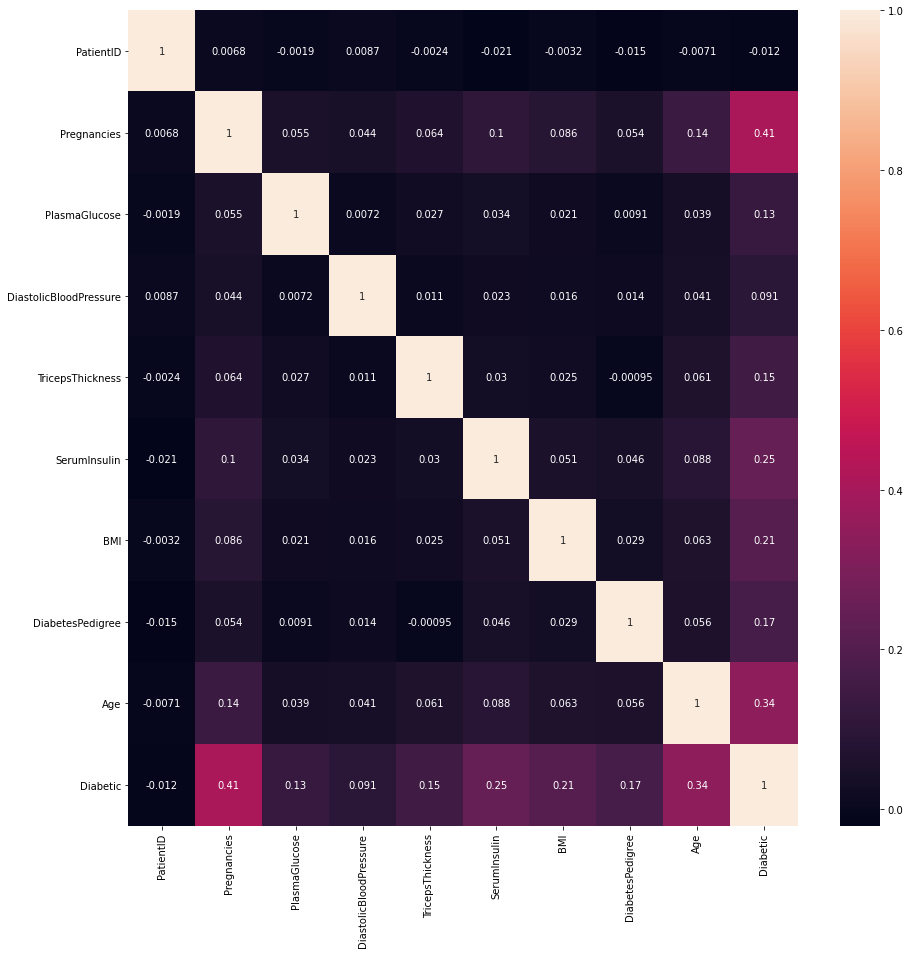

In [ ]:
corr = diabetes_df.corr()

# plot the heatmap
plt.figure(figsize=(15,15))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,annot = True)

**Before We Begin, Brief understanding of the important evaluation metrics are as follows :**

• The Confusion Matrix shows the number of True Positives and True Negatives (correctly classified) and False Negatives and False Positives (incorrectly classified).

• The AUC (Area Under the Curve) is the area under the ROC curve. A perfect classifier would have an AUC of 1.0, indicating no trade-off between True and False Positive Rates.

• Accuracy is the fraction of cases correctly classified.

• Recall, is the fraction of positive cases correctly classified from the total positive cases in the dataset.

• Precision is the fraction of positive cases correctly classified from all cases classified as positive.

# Applying Muller Loop for Imbalanced Class and Data Distributions

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from xgboost import XGBClassifier


names = ["Nearest Neighbors", "Linear SVM", "RBF SVM",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA","XGBoost"]

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(feature_matrix, label, train_size = 0.8)

In [ ]:
ylabel = label.unique()
ylabels = ["1" if x == 1 else "0" for x in ylabel]
ylabels

['0', '1']

In [ ]:
import time
classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
    XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)]


max_score = 0.0
max_class = ''

for name, clf in zip(names, classifiers):
    start_time = time.time()
    clf.fit(x_train, y_train)
    score = 100.0 * clf.score(x_test, y_test)
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds' % (time.time() - start_time))
    
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))



Classifier = Nearest Neighbors, Score (test, accuracy) = 83.37, Training time = 0.14 seconds
Classifier = Linear SVM, Score (test, accuracy) = 79.90, Training time = 27.24 seconds
Classifier = RBF SVM, Score (test, accuracy) = 68.23, Training time = 14.06 seconds
Classifier = Decision Tree, Score (test, accuracy) = 89.20, Training time = 0.04 seconds
Classifier = Random Forest, Score (test, accuracy) = 91.40, Training time = 0.06 seconds
Classifier = Neural Net, Score (test, accuracy) = 88.60, Training time = 8.16 seconds
Classifier = AdaBoost, Score (test, accuracy) = 95.00, Training time = 0.67 seconds
Classifier = Naive Bayes, Score (test, accuracy) = 80.27, Training time = 0.01 seconds
Classifier = QDA, Score (test, accuracy) = 80.17, Training time = 0.01 seconds
Classifier = XGBoost, Score (test, accuracy) = 94.90, Training time = 0.69 seconds
--------------------------------------------------------------------------------
Best --> Classifier = AdaBoost, Score (test, accuracy) = 9

The Top 4 Classifiers are: 

XGBoost

AdaBoost

Decision Tree

Random Forest

In [ ]:
target_names = ['Non-Diabetic', 'Diabetic']

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
adb=AdaBoostClassifier()
adb.fit(x_train,y_train)
y_pred = adb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix
cm_adb = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.97      0.96      0.96      2047
    Diabetic       0.92      0.93      0.92       953

    accuracy                           0.95      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.95      0.95      0.95      3000



In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_dt = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.93      0.93      0.93      2047
    Diabetic       0.84      0.84      0.84       953

    accuracy                           0.90      3000
   macro avg       0.88      0.88      0.88      3000
weighted avg       0.90      0.90      0.90      3000



In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_rf = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.91      0.95      0.93      2047
    Diabetic       0.89      0.80      0.85       953

    accuracy                           0.91      3000
   macro avg       0.90      0.88      0.89      3000
weighted avg       0.91      0.91      0.91      3000



In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_xgb = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.96      0.96      0.96      2047
    Diabetic       0.92      0.92      0.92       953

    accuracy                           0.95      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.95      0.95      0.95      3000



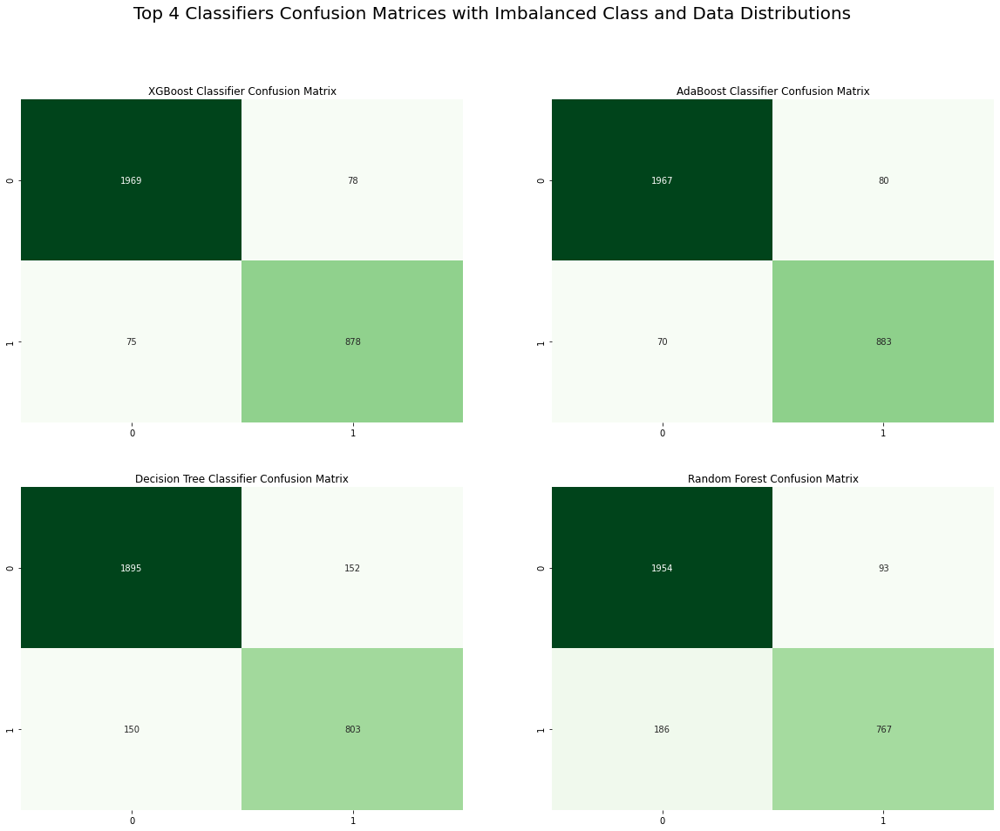

In [ ]:
plt.figure(figsize=(20,15))

plt.suptitle("Top 4 Classifiers Confusion Matrices with Imbalanced Class and Data Distributions",fontsize=20)

plt.subplot(2,2,1)
plt.title("XGBoost Classifier Confusion Matrix")
sns.heatmap(cm_xgb,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,2)
plt.title("AdaBoost Classifier Confusion Matrix")
sns.heatmap(cm_adb,cbar=False,annot=True,cmap="Greens",fmt="d")

plt.subplot(2,2,3)
plt.title("Decision Tree Classifier Confusion Matrix")
sns.heatmap(cm_dt,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,4)
plt.title("Random Forest Confusion Matrix")
sns.heatmap(cm_rf,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.show()

In [ ]:
#TPR = TP/(TP+FN) # FPR = FP/(FP+TN)
denominator = cm_xgb[0][0] + cm_xgb[1][0]
tpr1 = cm_xgb[0][0] /  denominator
denominator  = cm_xgb[0][1] + cm_xgb[1][1]
fpr1 =  cm_xgb[0][1] / denominator

denominator = cm_adb[0][0] + cm_adb[1][0]
tpr2 = cm_adb[0][0] /  denominator
denominator  = cm_adb[0][1] + cm_adb[1][1]
fpr2 =  cm_adb[0][1] / denominator 

denominator = cm_dt[0][0] + cm_dt[1][0]
tpr3 = cm_dt[0][0] /  denominator
denominator  = cm_dt[0][1] + cm_dt[1][1]
fpr3 =  cm_dt[0][1] / denominator

denominator = cm_rf[0][0] + cm_rf[1][0]
tpr4 = cm_rf[0][0] /  denominator
denominator  = cm_rf[0][1] + cm_rf[1][1]
fpr4 =  cm_rf[0][1] / denominator

In [ ]:
# predict probabilities
pred_prob1 = xgb.predict_proba(x_test)
pred_prob2 = adb.predict_proba(x_test)
pred_prob3 = dt.predict_proba(x_test)
pred_prob4 = rf.predict_proba(x_test)


### Confusion Matrix Slider Dashboard

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
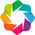

Column
    [0] Row
        [0] FloatSlider(step=0.001, value=0.488)
        [1] Markdown(str)
    [1] Row
        [0] HoloViews(Overlay)
        [1] HoloViews(Overlay)
        [2] HoloViews(Overlay)

In [ ]:
import numpy as np
import numba as nb
import holoviews as hv
import panel as pn

from matplotlib import cm

hv.extension('bokeh', 'matplotlib')
pn.extension()

pred = []
for i in range(len(pred_prob1)):
  pred.append(pred_prob1[i][1])
predarr = np.asarray(pred) 

# "Results" of a classifier
y_va_true = y_true.to_numpy()
y_va_pred = predarr
print(" ")

### helper funcs, optimized by numba ###

# generates hard predictions
@nb.njit
def pred_to_hard(val, arr):
    arr[arr > val] = 1
    arr[arr <= val] = 0
    return arr

# generates f1 score
@nb.njit
def f1_test(true, pred):
    # precision
    tp = pred[(true == 1) & (true == pred)].sum()
    pred_pos = (pred == 1).sum()
    pr = tp / pred_pos
    # recall
    actl_pos = (true == 1).sum()
    rc = tp / actl_pos
    return 2 * (pr * rc) / (pr + rc)

@nb.njit(parallel=True)
def gen_all_stats(pred, true):
    # initialize output, 1000 rows (.001 steps)
    out = np.zeros((1000,8))   
    for i in nb.prange(1000):
        cutoff = i / 1000.0
        hard = pred_to_hard(cutoff, pred.copy()).astype(np.int8)
        tp = np.sum((hard == 1) & (true == 1))
        tn = np.sum((hard == 0) & (true == 0))
        fp = np.sum((hard == 1) & (true == 0))
        fn = np.sum((hard == 0) & (true == 1))
        pr = tp / (hard == 1).sum()
        re = tp / (true == 1).sum()
        f1 = f1_test(true, hard)
        out[i] = np.array([cutoff,tp,fn,fp,tn,pr,re, f1])
       
    return out

# Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
data = gen_all_stats(y_va_pred, y_va_true)
optimal = data[np.argmax(data[:,7])]

### widgets ###
slider = pn.widgets.FloatSlider(start=0,
                                end=1,
                                step=.001, 
                                value = optimal[0])

default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
              format(*optimal[[0,7]])
md = pn.pane.Markdown(default_txt)

### layout ###
layout = pn.WidgetBox(slider, md)

### callbacks ###
def slider_update(event):
    curr_val = slider.value
    curr_idx = int(1000 * curr_val)
    f1 = data[curr_idx, 7]
    md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                     format(curr_val, f1)

### watchers ###
slider.param.watch(slider_update, 'value')


# we'll use some made up data for now
# In order, these are: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
optimal = np.array([.348,2241,754,30,16975,.9868,.7483,.8511])

# we need to use some weird indexing to get the values in the right spot
pos = [(0,1),(1,1),(0,0),(1,0)]
labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
hm_data = list(map(lambda tup,i: tup + (i,), 
                   pos, 
                   optimal[1:5].astype(int)))
label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                      pos,
                      labels,
                      optimal[1:5].astype(int)))

hm = hv.HeatMap(hm_data). \
    opts(cmap=cm.Blues,
         colorbar=False,
         xaxis='bare',
         yaxis='bare',
         height=512,
         width=512,
        )

hm*hv.Labels(label_data)

# for the AUC, we need only plot our FP vs TP
hv.Curve(data[:,[3,1]]). \
   opts(xrotation=45,
        xlabel='False Positive',
        ylabel='True Positive'
       )
# for the PR curve, we need only plot recall vs precision
hv.Curve(data[:,[6,5]]). \
   opts(xlim=(0,1),
        ylim=(0,1)
       )

class ClassificationDash():
    def __init__(self, pred, true):
        ### data ###
        self.pred = pred.copy()
        self.true = true.copy()
        # Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
        self.data = gen_all_stats(self.pred, self.true)
        self.init_idx = np.argmax(self.data[:,7])
        self.optimal = self.data[self.init_idx]
                
        ### widgets ###
        self.slider = pn.widgets.FloatSlider(start=0,
                                             end=1,
                                             step=.001, 
                                             value = self.optimal[0])
        default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
                      format(*self.optimal[[0,7]])
        self.md = pn.pane.Markdown(default_txt)
        self.cm = self.gen_cm(self.optimal[1:5].astype(int))
        self.auc = self.gen_auc(self.init_idx)
        self.pr = self.gen_pr(self.init_idx)
        
        ### layout ###
        self.row_01 = pn.layout.Row(self.slider,self.md)
        self.row_02 = pn.layout.Row(self.cm, self.auc, self.pr)
        self.layout = pn.layout.Column(self.row_01,self.row_02)
        '''
        self.layout = pn.WidgetBox(self.slider, 
                                   self.md, 
                                   self.hm,
                                   self.auc,
                                   self.pr
                                  )
        '''
        ### watchers ###
        self.slider.param.watch(self.slider_update, 'value')

    ### callbacks ###
    def slider_update(self, event):
        curr_val = self.slider.value
        curr_idx = int(curr_val * 1000)
        f1 = f1_test(self.true, 
                     pred_to_hard(curr_val, self.pred.copy()))
        self.md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                         format(curr_val, f1)
        self.row_02[0].object = self.gen_cm(self.data[curr_idx,1:5].astype(int))
        self.row_02[1].object = self.gen_auc(curr_idx)
        self.row_02[2].object = self.gen_pr(curr_idx)
        
    ### plotting funcs: this lets us update plots ###
    def gen_cm(self, data):
        # we need to use some weird indexing to get the values in the right spot
        pos = [(0,1),(1,1),(0,0),(1,0)]
        labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
        hm_data = list(map(lambda tup,i: tup + (i,), 
                           pos, 
                           data))
        label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                              pos,
                              labels,
                              data))

        hm = hv.HeatMap(hm_data). \
            opts(cmap=cm.Blues,
                 colorbar=False,
                 xaxis='bare',
                 yaxis='bare',
                )

        return hm*hv.Labels(label_data)
    
    def gen_auc(self, curr_idx):
        # setting limits on x for readability
        x_max = self.data[:,3].max()
        x_min = -int(x_max / 20)
        plot = hv.Curve(self.data[:,[3,1]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(x_min,x_max)
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[3,1]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    def gen_pr(self, curr_idx):
        plot = hv.Curve(self.data[:,[6,5]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(-.01,1),
                       ylim=(0,1.01)
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[6,5]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    ### helper funcs ###
    
    def show(self):
        return self.layout

dash = ClassificationDash(y_va_pred, y_va_true)
dash.show()              

In [ ]:
from sklearn.metrics import roc_curve
 
# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [ ]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

0.9889470476334984 0.9895175854307303 0.8841736505858393 0.9686988508763881


AUC-ROC for different classifiers in muller loop

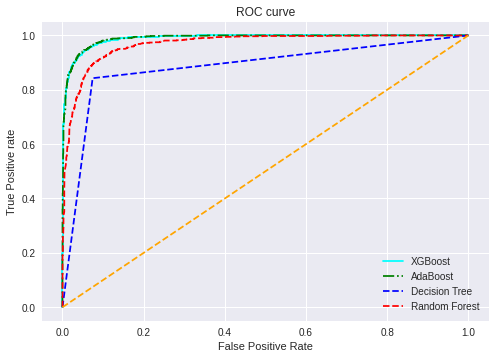

In [ ]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='-',color='cyan', label='XGBoost')
plt.plot(fpr2, tpr2, linestyle='-.',color='green', label='AdaBoost')
plt.plot(fpr3, tpr3, linestyle='--',color='blue', label='Decision Tree')
plt.plot(fpr4, tpr4, linestyle='--',color='red', label='Random Forest')
plt.plot(p_fpr, p_tpr, linestyle='--', color='orange')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [ ]:
def plot_features(data):
    plt.figure(figsize=(20, 10))
    sns.set(font_scale=1.2)
    sns.set_style('ticks') # change background to white background
    plt.suptitle('Visualizing The Data Distribution', y=0.95)

    plt.subplot(241)
    color_list = ['gold','purple','brown']
    data.Age.plot(kind='hist', color='brown')
    plt.xlabel('Age')
    plt.ylabel('Frequency')

    plt.subplot(242)
    color_list = ['gold','purple','brown']
    data.Pregnancies.plot(kind='hist', color='brown')
    plt.xlabel('Pregnancies')
    plt.ylabel('Frequency')

    plt.subplot(243)
    color_list = ['gold','purple','brown']
    data.PlasmaGlucose.plot(kind='hist', color='brown')
    plt.xlabel('PlasmaGlucose')
    plt.ylabel('Frequency')

    plt.subplot(244)
    color_list = ['gold','purple','brown']
    data.DiastolicBloodPressure.plot(kind='hist', color='brown')
    plt.xlabel('DiastolicBP')
    plt.ylabel('Frequency')

    plt.subplot(245)
    color_list = ['gold','purple','brown']
    data.TricepsThickness.plot(kind='hist', color='brown')
    plt.xlabel('TricepsThickness')
    plt.ylabel('Frequency')

    plt.subplot(246)
    color_list = ['gold','purple','brown']
    data.SerumInsulin.plot(kind='hist', color='brown')
    plt.xlabel('SerumInsulin')
    plt.ylabel('Frequency')

    plt.subplot(247)
    color_list = ['gold','purple','brown']
    data.BMI.plot(kind='hist', color='brown')
    plt.xlabel('BMI')
    plt.ylabel('Frequency')

    plt.subplot(248)
    color_list = ['gold','purple','brown']
    data.DiabetesPedigree.plot(kind='hist', color='brown')
    plt.xlabel('DiabetesPedigree')
    plt.ylabel('Frequency')

    plt.show()

### Visualizing the Data Distributions

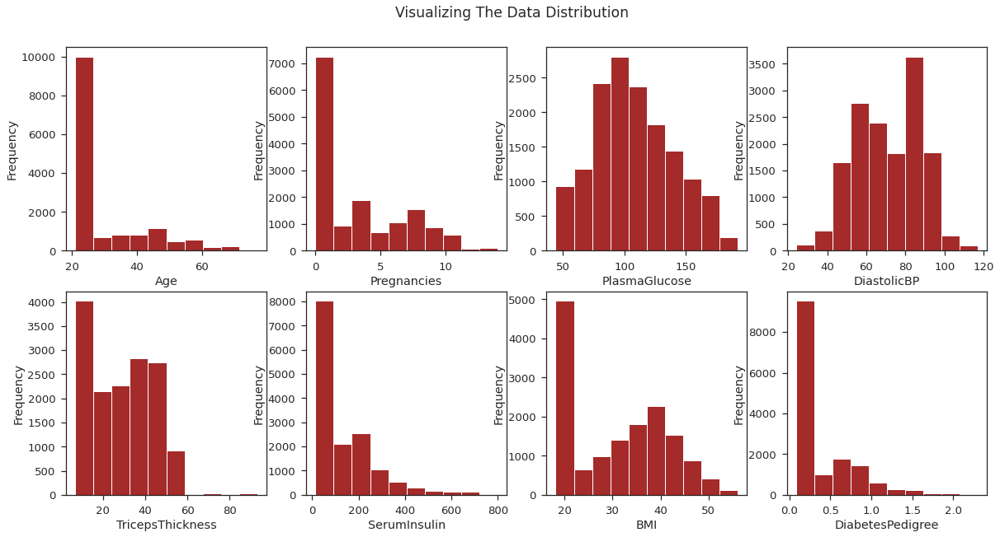

In [ ]:
plot_features(diabetes_df)

### Checking for the skewness of the data

I am considering the highly correlated feature i.e. pregnancy to check for the skewness

In [ ]:
diabetes_df['Pregnancies'].skew()

0.8235550501958153

We can see the the data is skewed to the right

In [ ]:
any(diabetes_df['Pregnancies']<0)

False

In [ ]:
diabetes_df['Pregnancies'] = diabetes_df['Pregnancies'].astype(float)

In [ ]:
for i in range(len(diabetes_df.Pregnancies)):
  if diabetes_df['Pregnancies'][i] == 0:
      diabetes_df['Pregnancies'][i] = 0.0001



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
from scipy import stats
preg_boxcox = stats.boxcox(diabetes_df['Pregnancies'])[0]
pd.Series(preg_boxcox).skew()

-0.5812740318081316

In [ ]:
diabetes_df['Pregnancies'] = pd.DataFrame(preg_boxcox)

In [ ]:
for i in range(len(diabetes_df.Pregnancies)):
  if diabetes_df['Pregnancies'][i] < -0.6 :
      diabetes_df['Pregnancies'][i] = -0.6
      

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
def plot_features(data):
    plt.figure(figsize=(20, 10))
    sns.set(font_scale=1.2)
    sns.set_style('ticks') # change background to white background
    plt.suptitle('Visualizing The Normalized Distribution', y=0.95)

    plt.subplot(241)
    color_list = ['gold','purple','brown']
    data.Pregnancies.plot(kind='hist', color='brown')
    plt.xlabel('Pregnancies')
    plt.ylabel('Frequency')
    plt.show()

In [ ]:
diabetes_df['Pregnancies'].skew()

0.273606886097432

And just like that, we’ve gone from the skew coefficient of 0.8 to 0.2

# Applying Muller Loop to Left Skewed Data Distribution

In [ ]:
feature_matrix = diabetes_df.drop(['PatientID','Diabetic'], axis=1)


In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(feature_matrix, label, train_size = 0.8)

In [ ]:
ylabel = label.unique()
ylabels = ["1" if x == 1 else "0" for x in ylabel]
ylabels

['0', '1']

In [ ]:
import time
classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
    XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)]


max_score = 0.0
max_class = ''

for name, clf in zip(names, classifiers):
    start_time = time.time()
    clf.fit(x_train, y_train)
    score = 100.0 * clf.score(x_test, y_test)
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds' % (time.time() - start_time))
    
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))



Classifier = Nearest Neighbors, Score (test, accuracy) = 81.17, Training time = 0.13 seconds
Classifier = Linear SVM, Score (test, accuracy) = 79.43, Training time = 22.65 seconds
Classifier = RBF SVM, Score (test, accuracy) = 66.57, Training time = 10.40 seconds
Classifier = Decision Tree, Score (test, accuracy) = 88.63, Training time = 0.04 seconds
Classifier = Random Forest, Score (test, accuracy) = 89.57, Training time = 0.06 seconds
Classifier = Neural Net, Score (test, accuracy) = 86.83, Training time = 7.38 seconds
Classifier = AdaBoost, Score (test, accuracy) = 94.57, Training time = 0.68 seconds
Classifier = Naive Bayes, Score (test, accuracy) = 81.00, Training time = 0.01 seconds
Classifier = QDA, Score (test, accuracy) = 81.10, Training time = 0.01 seconds
Classifier = XGBoost, Score (test, accuracy) = 94.70, Training time = 0.70 seconds
--------------------------------------------------------------------------------
Best --> Classifier = XGBoost, Score (test, accuracy) = 94

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
adb=AdaBoostClassifier()
adb.fit(x_train,y_train)
y_pred = adb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix
cm_adb = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.95      0.96      0.96      1997
    Diabetic       0.93      0.91      0.92      1003

    accuracy                           0.95      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.95      0.95      0.95      3000



In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_dt = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.92      0.93      0.93      1997
    Diabetic       0.86      0.85      0.85      1003

    accuracy                           0.90      3000
   macro avg       0.89      0.89      0.89      3000
weighted avg       0.90      0.90      0.90      3000



In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_rf = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.89      0.97      0.93      1997
    Diabetic       0.93      0.76      0.84      1003

    accuracy                           0.90      3000
   macro avg       0.91      0.86      0.88      3000
weighted avg       0.90      0.90      0.90      3000



In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_xgb = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.96      0.96      0.96      1997
    Diabetic       0.92      0.92      0.92      1003

    accuracy                           0.95      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.95      0.95      0.95      3000



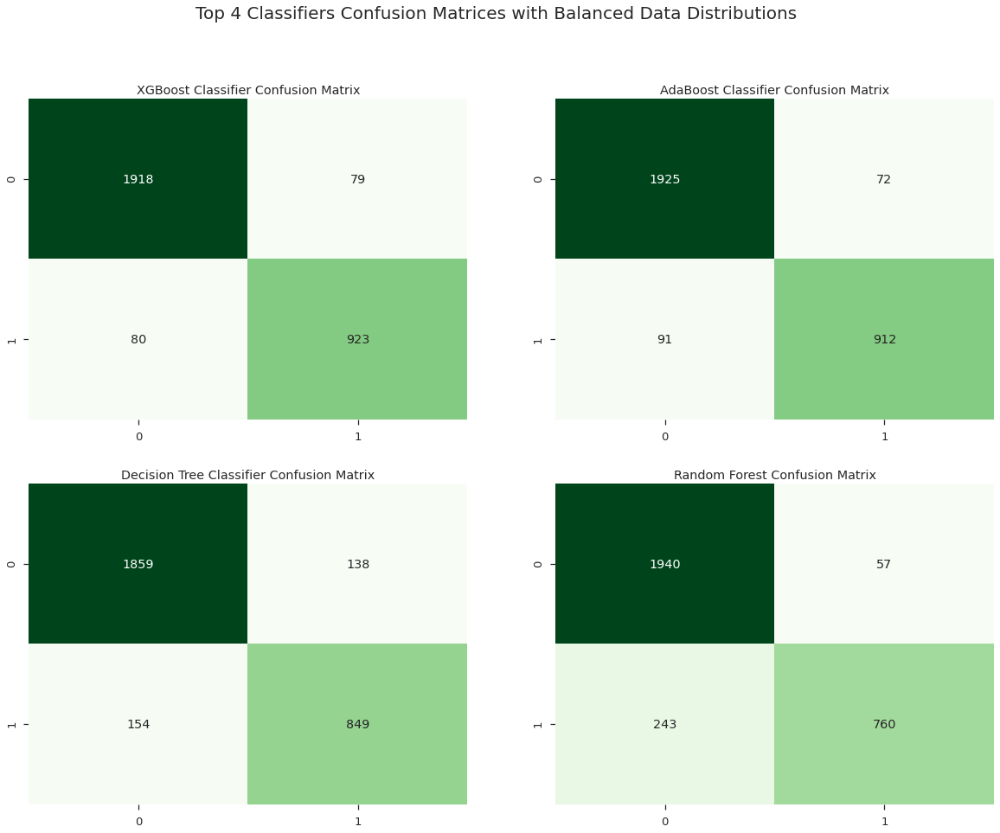

In [ ]:
plt.figure(figsize=(20,15))

plt.suptitle("Top 4 Classifiers Confusion Matrices with Balanced Data Distributions",fontsize=20)

plt.subplot(2,2,1)
plt.title("XGBoost Classifier Confusion Matrix")
sns.heatmap(cm_xgb,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,2)
plt.title("AdaBoost Classifier Confusion Matrix")
sns.heatmap(cm_adb,cbar=False,annot=True,cmap="Greens",fmt="d")

plt.subplot(2,2,3)
plt.title("Decision Tree Classifier Confusion Matrix")
sns.heatmap(cm_dt,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,4)
plt.title("Random Forest Confusion Matrix")
sns.heatmap(cm_rf,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.show()

In [ ]:
#TPR = TP/(TP+FN) # FPR = FP/(FP+TN)
denominator = cm_xgb[0][0] + cm_xgb[1][0]
tpr1 = cm_xgb[0][0] /  denominator
denominator  = cm_xgb[0][1] + cm_xgb[1][1]
fpr1 =  cm_xgb[0][1] / denominator 

denominator = cm_adb[0][0] + cm_adb[1][0]
tpr2 = cm_adb[0][0] /  denominator
denominator  = cm_adb[0][1] + cm_adb[1][1]
fpr2 =  cm_adb[0][1] / denominator 

denominator = cm_dt[0][0] + cm_dt[1][0]
tpr3 = cm_dt[0][0] /  denominator
denominator  = cm_dt[0][1] + cm_dt[1][1]
fpr3 =  cm_dt[0][1] / denominator

denominator = cm_rf[0][0] + cm_rf[1][0]
tpr4 = cm_rf[0][0] /  denominator
denominator  = cm_rf[0][1] + cm_rf[1][1]
fpr4 =  cm_rf[0][1] / denominator

In [ ]:
# predict probabilities
pred_prob1 = xgb.predict_proba(x_test)
pred_prob2 = adb.predict_proba(x_test)
pred_prob3 = dt.predict_proba(x_test)
pred_prob4 = rf.predict_proba(x_test)


### Confusion matrix slider Dashboard 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
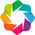

Column
    [0] Row
        [0] FloatSlider(step=0.001, value=0.504)
        [1] Markdown(str)
    [1] Row
        [0] HoloViews(Overlay)
        [1] HoloViews(Overlay)
        [2] HoloViews(Overlay)

In [ ]:
import numpy as np
import numba as nb
import holoviews as hv
import panel as pn

from matplotlib import cm

hv.extension('bokeh', 'matplotlib')
pn.extension()

pred = []
for i in range(len(pred_prob1)):
  pred.append(pred_prob1[i][1])
predarr = np.asarray(pred) 

# "Results" of a classifier
y_va_true = y_true.to_numpy()
y_va_pred = predarr
print(" ")

### helper funcs, optimized by numba ###

# generates hard predictions
@nb.njit
def pred_to_hard(val, arr):
    arr[arr > val] = 1
    arr[arr <= val] = 0
    return arr

# generates f1 score
@nb.njit
def f1_test(true, pred):
    # precision
    tp = pred[(true == 1) & (true == pred)].sum()
    pred_pos = (pred == 1).sum()
    pr = tp / pred_pos
    # recall
    actl_pos = (true == 1).sum()
    rc = tp / actl_pos
    return 2 * (pr * rc) / (pr + rc)

@nb.njit(parallel=True)
def gen_all_stats(pred, true):
    # initialize output, 1000 rows (.001 steps)
    out = np.zeros((1000,8))   
    for i in nb.prange(1000):
        cutoff = i / 1000.0
        hard = pred_to_hard(cutoff, pred.copy()).astype(np.int8)
        tp = np.sum((hard == 1) & (true == 1))
        tn = np.sum((hard == 0) & (true == 0))
        fp = np.sum((hard == 1) & (true == 0))
        fn = np.sum((hard == 0) & (true == 1))
        pr = tp / (hard == 1).sum()
        re = tp / (true == 1).sum()
        f1 = f1_test(true, hard)
        out[i] = np.array([cutoff,tp,fn,fp,tn,pr,re, f1])
       
    return out

# Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
data = gen_all_stats(y_va_pred, y_va_true)
optimal = data[np.argmax(data[:,7])]

### widgets ###
slider = pn.widgets.FloatSlider(start=0,
                                end=1,
                                step=.001, 
                                value = optimal[0])

default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
              format(*optimal[[0,7]])
md = pn.pane.Markdown(default_txt)

### layout ###
layout = pn.WidgetBox(slider, md)

### callbacks ###
def slider_update(event):
    curr_val = slider.value
    curr_idx = int(1000 * curr_val)
    f1 = data[curr_idx, 7]
    md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                     format(curr_val, f1)

### watchers ###
slider.param.watch(slider_update, 'value')


# we'll use some made up data for now
# In order, these are: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
optimal = np.array([.348,2241,754,30,16975,.9868,.7483,.8511])

# we need to use some weird indexing to get the values in the right spot
pos = [(0,1),(1,1),(0,0),(1,0)]
labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
hm_data = list(map(lambda tup,i: tup + (i,), 
                   pos, 
                   optimal[1:5].astype(int)))
label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                      pos,
                      labels,
                      optimal[1:5].astype(int)))

hm = hv.HeatMap(hm_data). \
    opts(cmap=cm.Blues,
         colorbar=False,
         xaxis='bare',
         yaxis='bare',
         height=512,
         width=512,
        )

hm*hv.Labels(label_data)

# for the AUC, we need only plot our FP vs TP
hv.Curve(data[:,[3,1]]). \
   opts(xrotation=45,
        xlabel='False Positive',
        ylabel='True Positive'
       )
# for the PR curve, we need only plot recall vs precision
hv.Curve(data[:,[6,5]]). \
   opts(xlim=(0,1),
        ylim=(0,1)
       )

class ClassificationDash():
    def __init__(self, pred, true):
        ### data ###
        self.pred = pred.copy()
        self.true = true.copy()
        # Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
        self.data = gen_all_stats(self.pred, self.true)
        self.init_idx = np.argmax(self.data[:,7])
        self.optimal = self.data[self.init_idx]
                
        ### widgets ###
        self.slider = pn.widgets.FloatSlider(start=0,
                                             end=1,
                                             step=.001, 
                                             value = self.optimal[0])
        default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
                      format(*self.optimal[[0,7]])
        self.md = pn.pane.Markdown(default_txt)
        self.cm = self.gen_cm(self.optimal[1:5].astype(int))
        self.auc = self.gen_auc(self.init_idx)
        self.pr = self.gen_pr(self.init_idx)
        
        ### layout ###
        self.row_01 = pn.layout.Row(self.slider,self.md)
        self.row_02 = pn.layout.Row(self.cm, self.auc, self.pr)
        self.layout = pn.layout.Column(self.row_01,self.row_02)
        '''
        self.layout = pn.WidgetBox(self.slider, 
                                   self.md, 
                                   self.hm,
                                   self.auc,
                                   self.pr
                                  )
        '''
        ### watchers ###
        self.slider.param.watch(self.slider_update, 'value')

    ### callbacks ###
    def slider_update(self, event):
        curr_val = self.slider.value
        curr_idx = int(curr_val * 1000)
        f1 = f1_test(self.true, 
                     pred_to_hard(curr_val, self.pred.copy()))
        self.md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                         format(curr_val, f1)
        self.row_02[0].object = self.gen_cm(self.data[curr_idx,1:5].astype(int))
        self.row_02[1].object = self.gen_auc(curr_idx)
        self.row_02[2].object = self.gen_pr(curr_idx)
        
    ### plotting funcs: this lets us update plots ###
    def gen_cm(self, data):
        # we need to use some weird indexing to get the values in the right spot
        pos = [(0,1),(1,1),(0,0),(1,0)]
        labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
        hm_data = list(map(lambda tup,i: tup + (i,), 
                           pos, 
                           data))
        label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                              pos,
                              labels,
                              data))

        hm = hv.HeatMap(hm_data). \
            opts(cmap=cm.Blues,
                 colorbar=False,
                 xaxis='bare',
                 yaxis='bare',
                )

        return hm*hv.Labels(label_data)
    
    def gen_auc(self, curr_idx):
        # setting limits on x for readability
        x_max = self.data[:,3].max()
        x_min = -int(x_max / 20)
        plot = hv.Curve(self.data[:,[3,1]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(0,1500),
                       ylim=(0,1500)
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[3,1]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    def gen_pr(self, curr_idx):
        plot = hv.Curve(self.data[:,[6,5]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(-.01,1),
                       ylim=(0,1.01),
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[6,5]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    ### helper funcs ###
    
    def show(self):
        return self.layout

dash = ClassificationDash(y_va_pred, y_va_true)
dash.show()              

In [ ]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [ ]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

0.9880653482716597 0.9886532191108197 0.8886784813311691 0.9641014363020104


AUC-ROC for different classifiers in muller loop

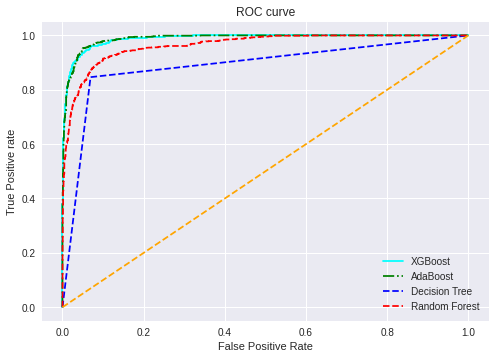

In [ ]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='-',color='cyan', label='XGBoost')
plt.plot(fpr2, tpr2, linestyle='-.',color='green', label='AdaBoost')
plt.plot(fpr3, tpr3, linestyle='--',color='blue', label='Decision Tree')
plt.plot(fpr4, tpr4, linestyle='--',color='red', label='Random Forest')
plt.plot(p_fpr, p_tpr, linestyle='--', color='orange')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

### Checking for the skewness of the data

Let's look at the distribution of each column, this would help us choose the most ideal feature normalization method.

We can see that features like Age, DiabetesPedigree, SerumInsulin and BMI seem to be skewed to the right.
This is due to a lot of smaller values and a progressive distribution of fewer large values.
Let's make the distribution better by using the log of the values, rather than actual values in these features.
This is a part of the feature-engineering process in Machine Learning

### Normalizing the Data Distribution

In [ ]:
for i in diabetes_df.columns:
    if i in ['Age', 'DiabetesPedigree', 'BMI', 'SerumInsulin']:
        print(i)
        diabetes_df[i] = diabetes_df[i].apply(np.log)

SerumInsulin
BMI
DiabetesPedigree
Age


In [ ]:
def plot_features(data):
    plt.figure(figsize=(20, 10))
    sns.set(font_scale=1.2)
    sns.set_style('ticks') # change background to white background
    plt.suptitle('Visualizing The Features Distribution', y=0.95)

    plt.subplot(241)
    color_list = ['gold','purple','brown']
    data.Age.plot(kind='hist', color='brown')
    plt.xlabel('Age')
    plt.ylabel('Frequency')

    plt.subplot(242)
    color_list = ['gold','purple','brown']
    data.Pregnancies.plot(kind='hist', color='brown')
    plt.xlabel('Pregnancies')
    plt.ylabel('Frequency')

    plt.subplot(243)
    color_list = ['gold','purple','brown']
    data.PlasmaGlucose.plot(kind='hist', color='brown')
    plt.xlabel('PlasmaGlucose')
    plt.ylabel('Frequency')

    plt.subplot(244)
    color_list = ['gold','purple','brown']
    data.DiastolicBloodPressure.plot(kind='hist', color='brown')
    plt.xlabel('DiastolicBP')
    plt.ylabel('Frequency')

    plt.subplot(245)
    color_list = ['gold','purple','brown']
    data.TricepsThickness.plot(kind='hist', color='brown')
    plt.xlabel('TricepsThickness')
    plt.ylabel('Frequency')

    plt.subplot(246)
    color_list = ['gold','purple','brown']
    data.SerumInsulin.plot(kind='hist', color='brown')
    plt.xlabel('SerumInsulin')
    plt.ylabel('Frequency')

    plt.subplot(247)
    color_list = ['gold','purple','brown']
    data.BMI.plot(kind='hist', color='brown')
    plt.xlabel('BMI')
    plt.ylabel('Frequency')

    plt.subplot(248)
    color_list = ['gold','purple','brown']
    data.DiabetesPedigree.plot(kind='hist', color='brown')
    plt.xlabel('DiabetesPedigree')
    plt.ylabel('Frequency')

    plt.show()

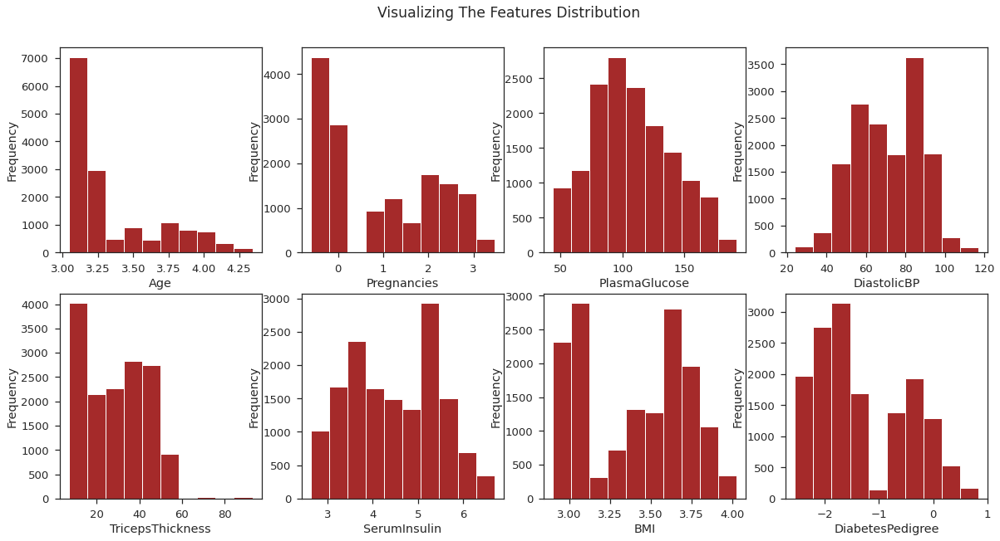

In [ ]:
plot_features(diabetes_df)

From the above plots, we can see an improvement to the distribution of our features.
This would help us achieve a better result when we train the model


# Applying Muller Loop on Normalized Data Distribution

In [ ]:
feature_matrix = diabetes_df.drop(['PatientID','Diabetic'], axis=1)


In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(feature_matrix, label, train_size = 0.8)

In [ ]:
ylabel = label.unique()
ylabels = ["1" if x == 1 else "0" for x in ylabel]
ylabels

['0', '1']

In [ ]:
import time
classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
    XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)]


max_score = 0.0
max_class = ''

for name, clf in zip(names, classifiers):
    start_time = time.time()
    clf.fit(x_train, y_train)
    score = 100.0 * clf.score(x_test, y_test)
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds' % (time.time() - start_time))
    
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))



Classifier = Nearest Neighbors, Score (test, accuracy) = 80.53, Training time = 0.11 seconds
Classifier = Linear SVM, Score (test, accuracy) = 80.87, Training time = 8.52 seconds
Classifier = RBF SVM, Score (test, accuracy) = 68.20, Training time = 16.38 seconds
Classifier = Decision Tree, Score (test, accuracy) = 89.37, Training time = 0.04 seconds
Classifier = Random Forest, Score (test, accuracy) = 91.07, Training time = 0.06 seconds
Classifier = Neural Net, Score (test, accuracy) = 86.37, Training time = 7.96 seconds
Classifier = AdaBoost, Score (test, accuracy) = 94.80, Training time = 0.67 seconds
Classifier = Naive Bayes, Score (test, accuracy) = 83.40, Training time = 0.01 seconds
Classifier = QDA, Score (test, accuracy) = 83.40, Training time = 0.01 seconds
Classifier = XGBoost, Score (test, accuracy) = 94.73, Training time = 0.69 seconds
--------------------------------------------------------------------------------
Best --> Classifier = AdaBoost, Score (test, accuracy) = 94

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
adb=AdaBoostClassifier()
adb.fit(x_train,y_train)
y_pred = adb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix
cm_adb = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.96      0.96      0.96      2045
    Diabetic       0.92      0.92      0.92       955

    accuracy                           0.95      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.95      0.95      0.95      3000



In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_dt = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.94      0.92      0.93      2045
    Diabetic       0.84      0.87      0.85       955

    accuracy                           0.91      3000
   macro avg       0.89      0.90      0.89      3000
weighted avg       0.91      0.91      0.91      3000



In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_rf = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.90      0.96      0.93      2045
    Diabetic       0.91      0.77      0.83       955

    accuracy                           0.90      3000
   macro avg       0.90      0.87      0.88      3000
weighted avg       0.90      0.90      0.90      3000



In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_xgb = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.97      0.96      0.96      2045
    Diabetic       0.91      0.93      0.92       955

    accuracy                           0.95      3000
   macro avg       0.94      0.94      0.94      3000
weighted avg       0.95      0.95      0.95      3000



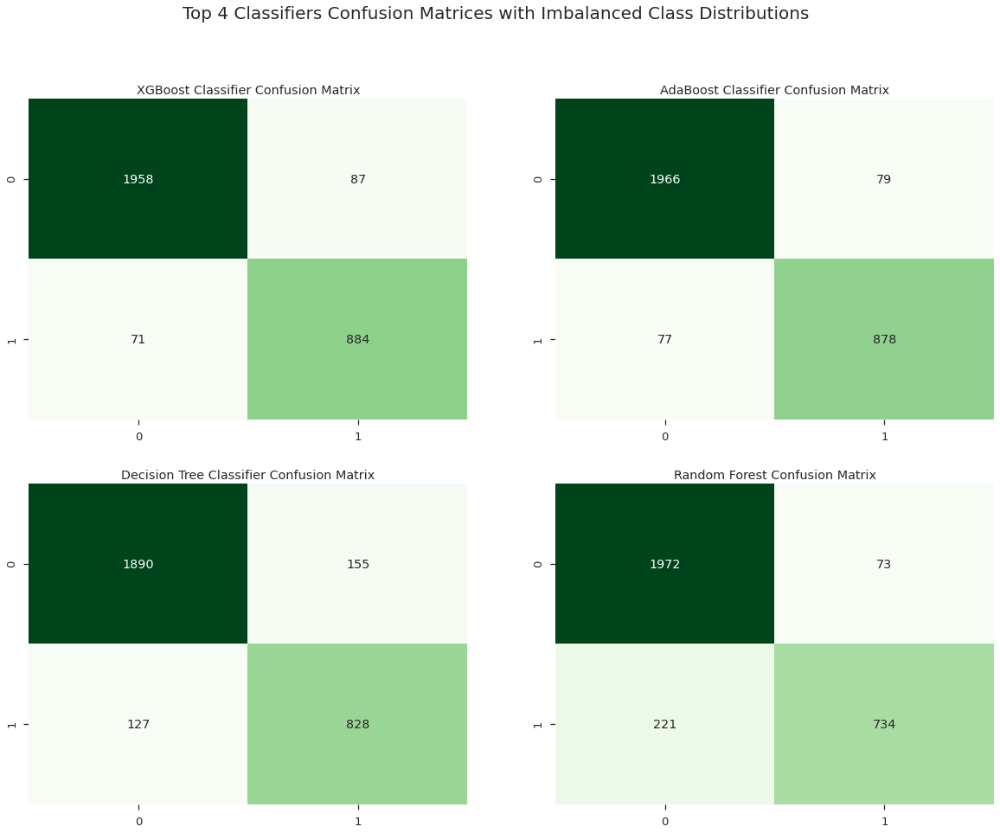

In [ ]:
plt.figure(figsize=(20,15))

plt.suptitle("Top 4 Classifiers Confusion Matrices with Imbalanced Class Distributions",fontsize=20)

plt.subplot(2,2,1)
plt.title("XGBoost Classifier Confusion Matrix")
sns.heatmap(cm_xgb,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,2)
plt.title("AdaBoost Classifier Confusion Matrix")
sns.heatmap(cm_adb,cbar=False,annot=True,cmap="Greens",fmt="d")

plt.subplot(2,2,3)
plt.title("Decision Tree Classifier Confusion Matrix")
sns.heatmap(cm_dt,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,4)
plt.title("Random Forest Confusion Matrix")
sns.heatmap(cm_rf,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.show()

In [ ]:
#TPR = TP/(TP+FN) # FPR = FP/(FP+TN)
denominator = cm_xgb[0][0] + cm_xgb[1][0]
tpr1 = cm_xgb[0][0] /  denominator
denominator  = cm_xgb[0][1] + cm_xgb[1][1]
fpr1 =  cm_xgb[0][1] / denominator   

denominator = cm_adb[0][0] + cm_adb[1][0]
tpr2 = cm_adb[0][0] /  denominator
denominator  = cm_adb[0][1] + cm_adb[1][1]
fpr2 =  cm_adb[0][1] / denominator

denominator = cm_dt[0][0] + cm_dt[1][0]
tpr3 = cm_dt[0][0] /  denominator
denominator  = cm_dt[0][1] + cm_dt[1][1]
fpr3 =  cm_dt[0][1] / denominator

denominator = cm_rf[0][0] + cm_rf[1][0]
tpr4 = cm_rf[0][0] /  denominator
denominator  = cm_rf[0][1] + cm_rf[1][1]
fpr4 =  cm_rf[0][1] / denominator

In [ ]:
# predict probabilities
pred_prob1 = xgb.predict_proba(x_test)
pred_prob2 = adb.predict_proba(x_test)
pred_prob3 = dt.predict_proba(x_test)
pred_prob4 = rf.predict_proba(x_test)


### Confusion Matrix Slider Dashboard 

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
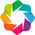

Column
    [0] Row
        [0] FloatSlider(step=0.001, value=0.539)
        [1] Markdown(str)
    [1] Row
        [0] HoloViews(Overlay)
        [1] HoloViews(Overlay)
        [2] HoloViews(Overlay)

In [ ]:
import numpy as np
import numba as nb
import holoviews as hv
import panel as pn

from matplotlib import cm

hv.extension('bokeh', 'matplotlib')
pn.extension()

pred = []
for i in range(len(pred_prob1)):
  pred.append(pred_prob1[i][1])
predarr = np.asarray(pred) 

# "Results" of a classifier
y_va_true = y_true.to_numpy()
y_va_pred = predarr
print(" ")

### helper funcs, optimized by numba ###

# generates hard predictions
@nb.njit
def pred_to_hard(val, arr):
    arr[arr > val] = 1
    arr[arr <= val] = 0
    return arr

# generates f1 score
@nb.njit
def f1_test(true, pred):
    # precision
    tp = pred[(true == 1) & (true == pred)].sum()
    pred_pos = (pred == 1).sum()
    pr = tp / pred_pos
    # recall
    actl_pos = (true == 1).sum()
    rc = tp / actl_pos
    return 2 * (pr * rc) / (pr + rc)

@nb.njit(parallel=True)
def gen_all_stats(pred, true):
    # initialize output, 1000 rows (.001 steps)
    out = np.zeros((1000,8))   
    for i in nb.prange(1000):
        cutoff = i / 1000.0
        hard = pred_to_hard(cutoff, pred.copy()).astype(np.int8)
        tp = np.sum((hard == 1) & (true == 1))
        tn = np.sum((hard == 0) & (true == 0))
        fp = np.sum((hard == 1) & (true == 0))
        fn = np.sum((hard == 0) & (true == 1))
        pr = tp / (hard == 1).sum()
        re = tp / (true == 1).sum()
        f1 = f1_test(true, hard)
        out[i] = np.array([cutoff,tp,fn,fp,tn,pr,re, f1])
       
    return out

# Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
data = gen_all_stats(y_va_pred, y_va_true)
optimal = data[np.argmax(data[:,7])]

### widgets ###
slider = pn.widgets.FloatSlider(start=0,
                                end=1,
                                step=.001, 
                                value = optimal[0])

default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
              format(*optimal[[0,7]])
md = pn.pane.Markdown(default_txt)

### layout ###
layout = pn.WidgetBox(slider, md)

### callbacks ###
def slider_update(event):
    curr_val = slider.value
    curr_idx = int(1000 * curr_val)
    f1 = data[curr_idx, 7]
    md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                     format(curr_val, f1)

### watchers ###
slider.param.watch(slider_update, 'value')


# we'll use some made up data for now
# In order, these are: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
optimal = np.array([.348,2241,754,30,16975,.9868,.7483,.8511])

# we need to use some weird indexing to get the values in the right spot
pos = [(0,1),(1,1),(0,0),(1,0)]
labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
hm_data = list(map(lambda tup,i: tup + (i,), 
                   pos, 
                   optimal[1:5].astype(int)))
label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                      pos,
                      labels,
                      optimal[1:5].astype(int)))

hm = hv.HeatMap(hm_data). \
    opts(cmap=cm.Blues,
         colorbar=False,
         xaxis='bare',
         yaxis='bare',
         height=512,
         width=512,
        )

hm*hv.Labels(label_data)

# for the AUC, we need only plot our FP vs TP
hv.Curve(data[:,[3,1]]). \
   opts(xrotation=45,
        xlabel='False Positive',
        ylabel='True Positive'
       )
# for the PR curve, we need only plot recall vs precision
hv.Curve(data[:,[6,5]]). \
   opts(xlim=(0,1),
        ylim=(0,1)
       )

class ClassificationDash():
    def __init__(self, pred, true):
        ### data ###
        self.pred = pred.copy()
        self.true = true.copy()
        # Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
        self.data = gen_all_stats(self.pred, self.true)
        self.init_idx = np.argmax(self.data[:,7])
        self.optimal = self.data[self.init_idx]
                
        ### widgets ###
        self.slider = pn.widgets.FloatSlider(start=0,
                                             end=1,
                                             step=.001, 
                                             value = self.optimal[0])
        default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
                      format(*self.optimal[[0,7]])
        self.md = pn.pane.Markdown(default_txt)
        self.cm = self.gen_cm(self.optimal[1:5].astype(int))
        self.auc = self.gen_auc(self.init_idx)
        self.pr = self.gen_pr(self.init_idx)
        
        ### layout ###
        self.row_01 = pn.layout.Row(self.slider,self.md)
        self.row_02 = pn.layout.Row(self.cm, self.auc, self.pr)
        self.layout = pn.layout.Column(self.row_01,self.row_02)
        '''
        self.layout = pn.WidgetBox(self.slider, 
                                   self.md, 
                                   self.hm,
                                   self.auc,
                                   self.pr
                                  )
        '''
        ### watchers ###
        self.slider.param.watch(self.slider_update, 'value')

    ### callbacks ###
    def slider_update(self, event):
        curr_val = self.slider.value
        curr_idx = int(curr_val * 1000)
        f1 = f1_test(self.true, 
                     pred_to_hard(curr_val, self.pred.copy()))
        self.md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                         format(curr_val, f1)
        self.row_02[0].object = self.gen_cm(self.data[curr_idx,1:5].astype(int))
        self.row_02[1].object = self.gen_auc(curr_idx)
        self.row_02[2].object = self.gen_pr(curr_idx)
        
    ### plotting funcs: this lets us update plots ###
    def gen_cm(self, data):
        # we need to use some weird indexing to get the values in the right spot
        pos = [(0,1),(1,1),(0,0),(1,0)]
        labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
        hm_data = list(map(lambda tup,i: tup + (i,), 
                           pos, 
                           data))
        label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                              pos,
                              labels,
                              data))

        hm = hv.HeatMap(hm_data). \
            opts(cmap=cm.Blues,
                 colorbar=False,
                 xaxis='bare',
                 yaxis='bare',
                )

        return hm*hv.Labels(label_data)
    
    def gen_auc(self, curr_idx):
        # setting limits on x for readability
        x_max = self.data[:,3].max()
        x_min = -int(x_max / 20)
        plot = hv.Curve(self.data[:,[3,1]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(x_min,x_max)
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[3,1]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    def gen_pr(self, curr_idx):
        plot = hv.Curve(self.data[:,[6,5]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(-.01,1),
                       ylim=(0,1.01)
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[6,5]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    ### helper funcs ###
    
    def show(self):
        return self.layout

dash = ClassificationDash(y_va_pred, y_va_true)
dash.show()              

In [ ]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [ ]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

0.9900352027035676 0.9911970199311306 0.8956105428896939 0.9647814232133027


AUC-ROC for different classifiers in muller loop

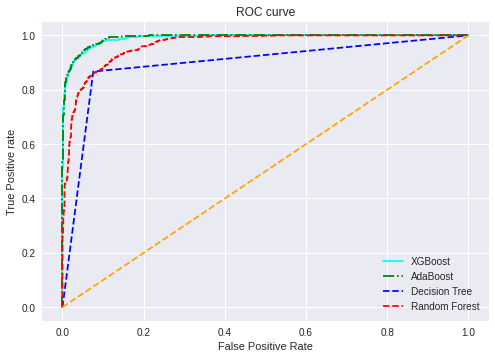

In [ ]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='-',color='cyan', label='XGBoost')
plt.plot(fpr2, tpr2, linestyle='-.',color='green', label='AdaBoost')
plt.plot(fpr3, tpr3, linestyle='--',color='blue', label='Decision Tree')
plt.plot(fpr4, tpr4, linestyle='--',color='red', label='Random Forest')
plt.plot(p_fpr, p_tpr, linestyle='--', color='orange')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

# Checking for Class Imbalance

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


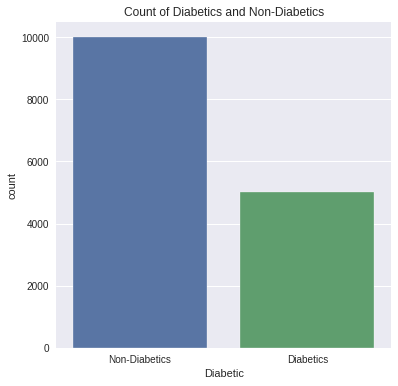

In [ ]:
plt.figure(figsize=(6, 6))

x = diabetes_df.Diabetic.replace(to_replace=[0, 1], value=['Non-Diabetics','Diabetics'])
sns.countplot(x)
plt.title('Count of Diabetics and Non-Diabetics')
plt.show()

We can see that out of the 15,000 observations in our dataset, the Non-Diabetic class has 10,000 entries, while Diabetic class has only 5,000 entries.
This is an imbalanced Dataset and the risk involved is that our Model may learn one class features more than the other.
We need to find a way to balance the Dataset for a more unbiased and reliable classification



## Let's balance the class distribution and train a new model

We need to balance The Data set because in an imbalanced Data set Accuracy is not a reliable metric for the real performance of a classifier, because it will yield misleading results.

F1 score too, would even be more unreliable in an imbalanced Data set

# SMOTE - Synthetic Minority Over-sampling Technique

In [ ]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(sampling_strategy='minority', random_state=19, k_neighbors=5)

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
over_sampled_features, over_sampled_label = sm.fit_resample(feature_matrix, label)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
print('Shape of resampled feature set is:',over_sampled_features.shape)
print('Shape of resampled target data is:',over_sampled_label.shape)

Shape of resampled feature set is: (20000, 8)
Shape of resampled target data is: (20000,)


Let's concat the features and target back into one data frame

In [ ]:
over_sampled_df = pd.DataFrame(over_sampled_features, columns=['Pregnancies','PlasmaGlucose','DiastolicBloodPressure','TricepsThickness','SerumInsulin','BMI','DiabetesPedigree','Age'])

over_sampled_df['Diabetic'] = over_sampled_label

over_sampled_df.head()

,Pregnancies,PlasmaGlucose,DiastolicBloodPressure,TricepsThickness,SerumInsulin,BMI,DiabetesPedigree,Age,Diabetic
0,-0.600000,171.0,80.0,34.0,3.135494,3.772984,0.193254,3.044522,0
1,2.570272,92.0,93.0,47.0,3.583519,3.055913,-1.842853,3.135494,0
2,2.371719,115.0,47.0,52.0,3.555348,3.725971,-2.538072,3.135494,0
3,2.749798,103.0,78.0,25.0,5.717028,3.387173,0.249100,3.761200,1
4,0.000000,85.0,59.0,27.0,3.555348,3.751961,-0.598670,3.091042,0


In [ ]:
over_sampled_df.shape

(20000, 9)

Let's visualize the new distribution

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


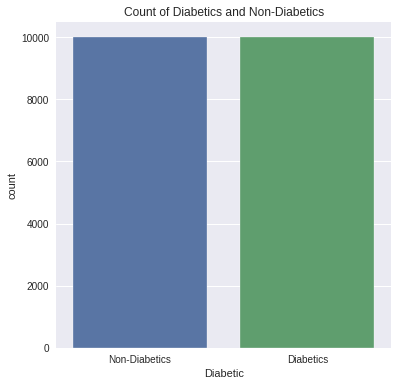

In [ ]:
plt.figure(figsize=(6, 6))

x = over_sampled_df.Diabetic.replace(to_replace=[0, 1], value=['Non-Diabetics','Diabetics'])
sns.countplot(x)
plt.title('Count of Diabetics and Non-Diabetics')
plt.show()

Okay so the above is a well balanced dataset. let's go on to train the model by first splitting the dataset

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(over_sampled_df.iloc[:,:-1], over_sampled_df.Diabetic, test_size=0.3, random_state=1234)

print('x_train shape is',x_train.shape)
print('x_test shape is',x_test.shape)
print('y_train shape is',y_train.shape)
print('y_test shape is',y_test.shape)

x_train shape is (14000, 8)
x_test shape is (6000, 8)
y_train shape is (14000,)
y_test shape is (6000,)


In [ ]:
ylabel = over_sampled_df['Diabetic'].unique()
ylabels = ["1" if x == 1 else "0" for x in ylabel]
ylabels

['0', '1']

# Applying Muller Loop on Balanced Class Distribution

In [ ]:
import time
classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis(),
    XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)]


max_score = 0.0
max_class = ''

for name, clf in zip(names, classifiers):
    start_time = time.time()
    clf.fit(x_train, y_train)
    score = 100.0 * clf.score(x_test, y_test)
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds' % (time.time() - start_time))
    
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )
print('Best --> Classifier = %s, Score (test, accuracy) = %.2f' %(max_class, max_score))



Classifier = Nearest Neighbors, Score (test, accuracy) = 85.20, Training time = 0.22 seconds
Classifier = Linear SVM, Score (test, accuracy) = 82.25, Training time = 11.15 seconds
Classifier = RBF SVM, Score (test, accuracy) = 71.22, Training time = 26.38 seconds
Classifier = Decision Tree, Score (test, accuracy) = 90.93, Training time = 0.05 seconds
Classifier = Random Forest, Score (test, accuracy) = 91.83, Training time = 0.08 seconds
Classifier = Neural Net, Score (test, accuracy) = 86.95, Training time = 8.75 seconds
Classifier = AdaBoost, Score (test, accuracy) = 95.03, Training time = 0.89 seconds
Classifier = Naive Bayes, Score (test, accuracy) = 85.90, Training time = 0.01 seconds
Classifier = QDA, Score (test, accuracy) = 85.83, Training time = 0.01 seconds
Classifier = XGBoost, Score (test, accuracy) = 95.33, Training time = 0.89 seconds
--------------------------------------------------------------------------------
Best --> Classifier = XGBoost, Score (test, accuracy) = 95


We can clearly see a boost in model performance by just balancing the dataset.
The model generalises better and is more accurate and confident in its classification tasks

Top Classifers:

XGBoost

AdaBoost

Decision Tree

Random Forest

In [ ]:
from sklearn.tree import DecisionTreeClassifier
adb=AdaBoostClassifier()
adb.fit(x_train,y_train)
y_pred = adb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix
cm_adb = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.95      0.95      0.95      2982
    Diabetic       0.95      0.95      0.95      3018

    accuracy                           0.95      6000
   macro avg       0.95      0.95      0.95      6000
weighted avg       0.95      0.95      0.95      6000



In [ ]:
from sklearn.ensemble import AdaBoostClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix
cm_dt = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.92      0.91      0.92      2982
    Diabetic       0.91      0.92      0.92      3018

    accuracy                           0.92      6000
   macro avg       0.92      0.92      0.92      6000
weighted avg       0.92      0.92      0.92      6000



In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix
cm_rf = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.93      0.91      0.92      2982
    Diabetic       0.91      0.93      0.92      3018

    accuracy                           0.92      6000
   macro avg       0.92      0.92      0.92      6000
weighted avg       0.92      0.92      0.92      6000



In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_xgb = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       0.96      0.95      0.95      2982
    Diabetic       0.95      0.96      0.95      3018

    accuracy                           0.95      6000
   macro avg       0.95      0.95      0.95      6000
weighted avg       0.95      0.95      0.95      6000



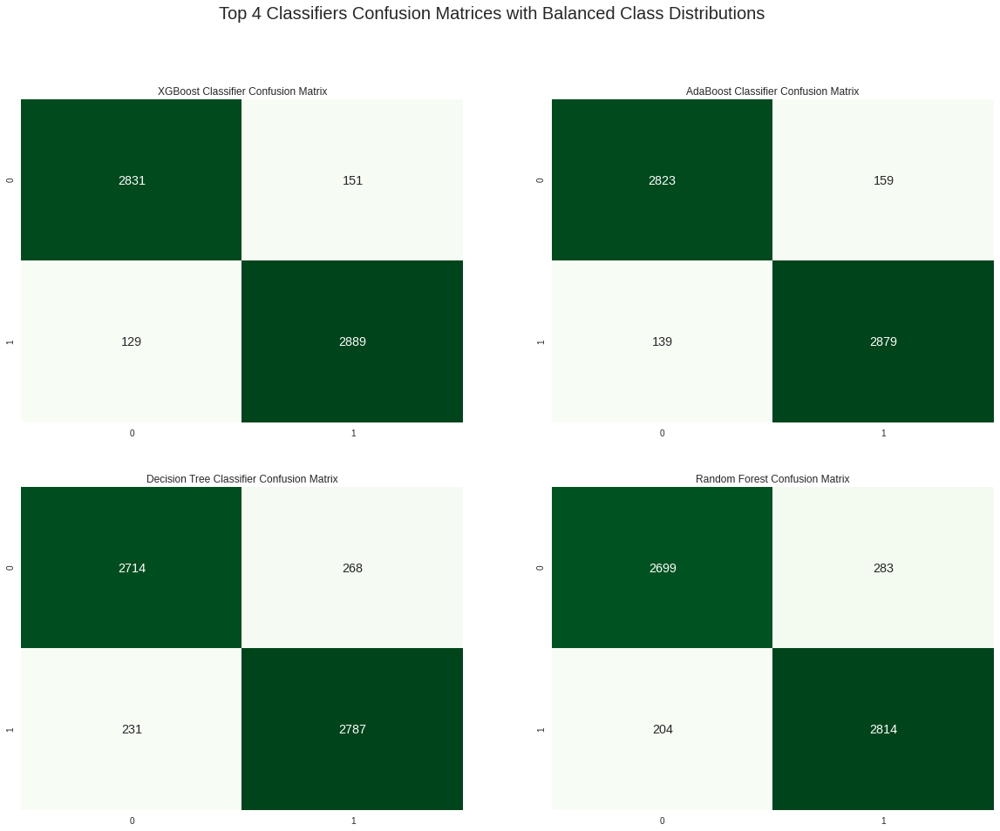

In [ ]:
plt.figure(figsize=(20,15))

plt.suptitle("Top 4 Classifiers Confusion Matrices with Balanced Class Distributions",fontsize=20)

plt.subplot(2,2,1)
plt.title("XGBoost Classifier Confusion Matrix")
sns.heatmap(cm_xgb,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,2)
plt.title("AdaBoost Classifier Confusion Matrix")
sns.heatmap(cm_adb,cbar=False,annot=True,cmap="Greens",fmt="d")

plt.subplot(2,2,3)
plt.title("Decision Tree Classifier Confusion Matrix")
sns.heatmap(cm_dt,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,4)
plt.title("Random Forest Confusion Matrix")
sns.heatmap(cm_rf,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.show()

In [ ]:
#TPR = TP/(TP+FN) # FPR = FP/(FP+TN)
denominator = cm_xgb[0][0] + cm_xgb[1][0]
tpr1 = cm_xgb[0][0] /  denominator
denominator  = cm_xgb[0][1] + cm_xgb[1][1]
fpr1 =  cm_xgb[0][1] / denominator   

denominator = cm_adb[0][0] + cm_adb[1][0]
tpr2 = cm_adb[0][0] /  denominator
denominator  = cm_adb[0][1] + cm_adb[1][1]
fpr2 =  cm_adb[0][1] / denominator

denominator = cm_dt[0][0] + cm_dt[1][0]
tpr3 = cm_dt[0][0] /  denominator
denominator  = cm_dt[0][1] + cm_dt[1][1]
fpr3 =  cm_dt[0][1] / denominator

denominator = cm_rf[0][0] + cm_rf[1][0]
tpr4 = cm_rf[0][0] /  denominator
denominator  = cm_rf[0][1] + cm_rf[1][1]
fpr4 =  cm_rf[0][1] / denominator

In [ ]:
# predict probabilities
pred_prob1 = xgb.predict_proba(x_test)
pred_prob2 = adb.predict_proba(x_test)
pred_prob3 = dt.predict_proba(x_test)
pred_prob4 = rf.predict_proba(x_test)


In [ ]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [ ]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

0.991306020350066 0.9905674937631089 0.9167933378934975 0.9738210020005166


AUC-ROC for different classifiers in muller loop

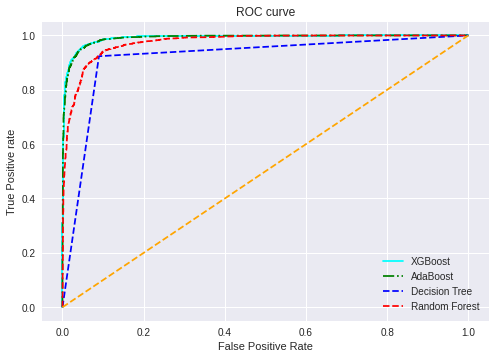

In [ ]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='-',color='cyan', label='XGBoost')
plt.plot(fpr2, tpr2, linestyle='-.',color='green', label='AdaBoost')
plt.plot(fpr3, tpr3, linestyle='--',color='blue', label='Decision Tree')
plt.plot(fpr4, tpr4, linestyle='--',color='red', label='Random Forest')
plt.plot(p_fpr, p_tpr, linestyle='--', color='orange')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

In [ ]:
pred = []
for i in range(len(pred_prob1)):
  pred.append(pred_prob1[i][1])
predarr = np.asarray(pred)  

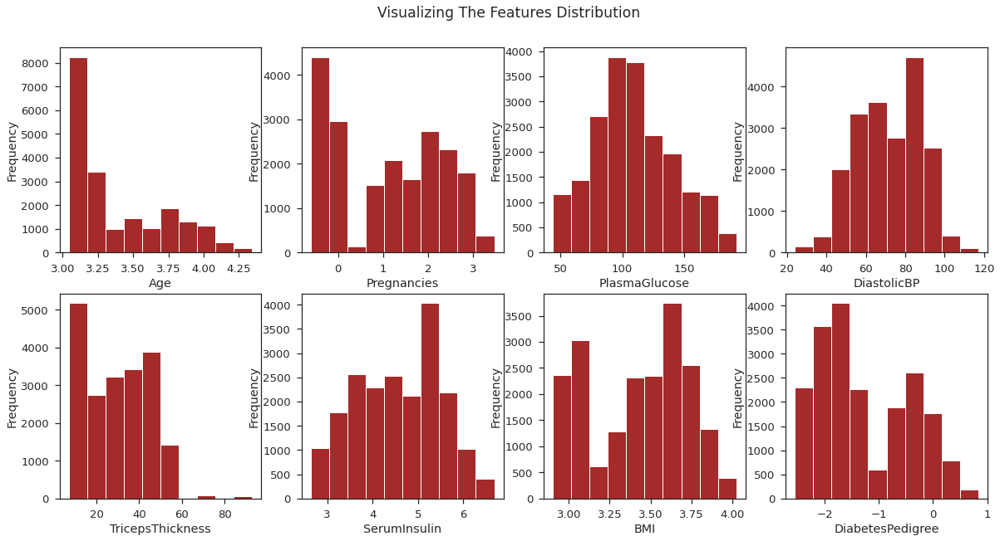

In [ ]:
plot_features(over_sampled_df)

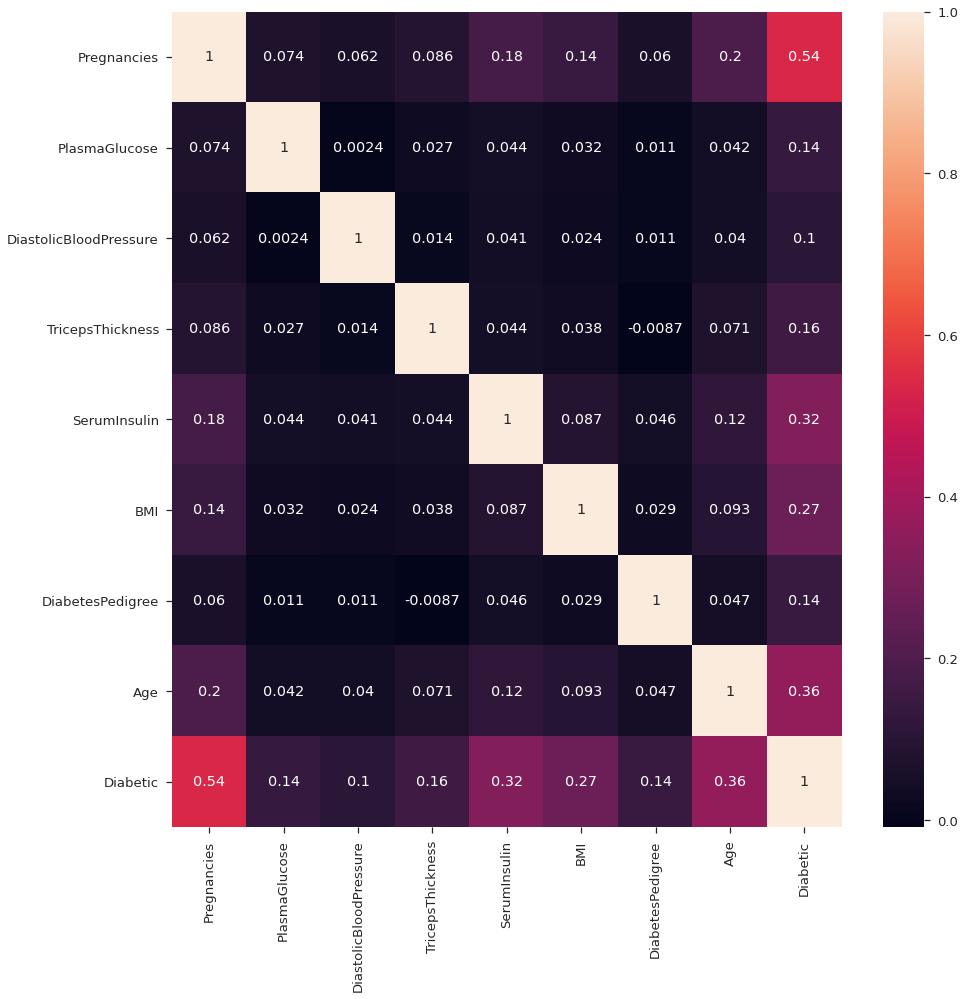

In [ ]:
corr = over_sampled_df.corr()

# plot the heatmap
plt.figure(figsize=(15,15))
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns,annot = True)

### Checking for the skewness of the data

In [ ]:
over_sampled_df['DiabetesPedigree'].skew()

0.4085724111065856

In [ ]:
over_sampled_df['Age'].skew()

0.7928865896511484

In [ ]:
over_sampled_df['SerumInsulin'].skew()

-0.12778307030413608

In [ ]:
over_sampled_df['BMI'].skew()

-0.24328661542217958

Since the data is now skewed after balancing the classes we need to normalize the data for better results

In [ ]:
for i in over_sampled_df.columns:
    if i in ['Age', 'DiabetesPedigree']:
        print(i)
        over_sampled_df[i] = over_sampled_df[i].apply(np.log)

DiabetesPedigree
Age


In [ ]:
over_sampled_df = over_sampled_df.dropna(subset=['Age'])
over_sampled_df = over_sampled_df.reset_index(drop=True)

In [ ]:
over_sampled_df.shape

(20000, 9)

And just like that, we’ve gone from the skew coefficient of 0.8 to 0.2

In [ ]:
feature_matrix = over_sampled_df.drop(['PlasmaGlucose','DiastolicBloodPressure','DiabetesPedigree'], axis=1)
feature_matrix.head() 

,Pregnancies,TricepsThickness,SerumInsulin,BMI,Age,Diabetic
0,-0.600000,34.0,3.135494,3.772984,1.113344,0
1,2.570272,47.0,3.583519,3.055913,1.142787,0
2,2.371719,52.0,3.555348,3.725971,1.142787,0
3,2.749798,25.0,5.717028,3.387173,1.324738,1
4,0.000000,27.0,3.555348,3.751961,1.128508,0


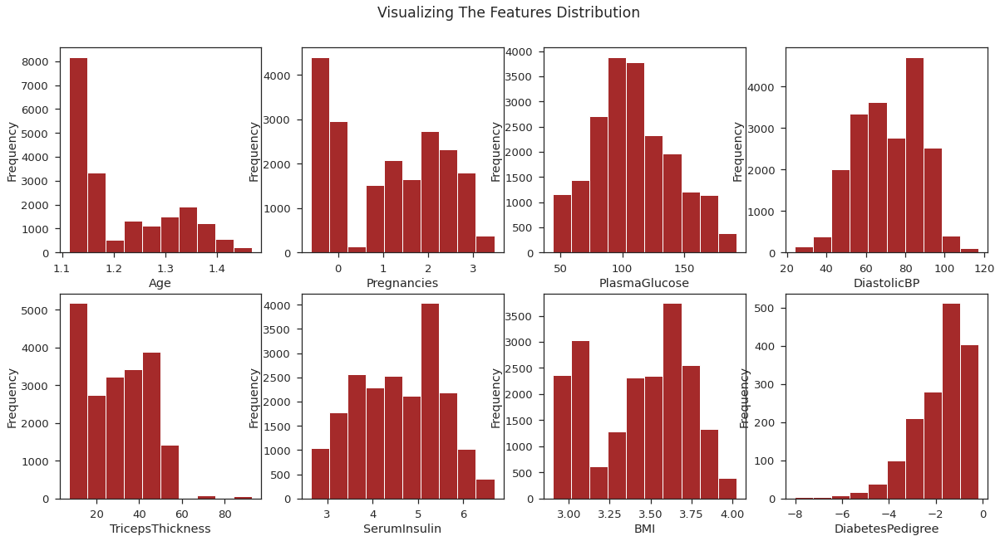

In [ ]:
plot_features(over_sampled_df)

In [ ]:
label = over_sampled_df.Diabetic
label.head()

0    0
1    0
2    0
3    1
4    0
Name: Diabetic, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(feature_matrix, label, train_size = 0.8)

In [ ]:
ylabel = label.unique()
ylabels = ["1" if x == 1 else "0" for x in ylabel]
ylabels

['0', '1']

# Applying Muller Loop on Balanced Class and Balanced Data Distributions

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from xgboost import XGBClassifier


names = ["Nearest Neighbors", "Linear SVM", "RBF SVM",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "XGBoost"]

In [ ]:
import time
classifiers = [
    KNeighborsClassifier(2),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)]


max_score = 0.0
max_class = ''

for name, clf in zip(names, classifiers):
    start_time = time.time()
    clf.fit(x_train, y_train)
    score = 100.0 * clf.score(x_test, y_test)
    print('Classifier = %s, Score (test, accuracy) = %.2f,' %(name, score), 'Training time = %.2f seconds' % (time.time() - start_time))
    
    if score > max_score:
        clf_best = clf
        max_score = score
        max_class = name

print(80*'-' )

Classifier = Nearest Neighbors, Score (test, accuracy) = 99.95, Training time = 0.14 seconds
Classifier = Linear SVM, Score (test, accuracy) = 100.00, Training time = 0.07 seconds
Classifier = RBF SVM, Score (test, accuracy) = 99.92, Training time = 11.01 seconds
Classifier = Decision Tree, Score (test, accuracy) = 100.00, Training time = 0.01 seconds
Classifier = Random Forest, Score (test, accuracy) = 99.95, Training time = 0.06 seconds
Classifier = Neural Net, Score (test, accuracy) = 100.00, Training time = 4.24 seconds
Classifier = AdaBoost, Score (test, accuracy) = 100.00, Training time = 0.02 seconds
Classifier = Naive Bayes, Score (test, accuracy) = 100.00, Training time = 0.01 seconds
Classifier = XGBoost, Score (test, accuracy) = 100.00, Training time = 0.55 seconds
--------------------------------------------------------------------------------


In [ ]:
target_names = ['Non-Diabetic', 'Diabetic']

In [ ]:
from sklearn.ensemble import AdaBoostClassifier
adb=AdaBoostClassifier()
adb.fit(x_train,y_train)
y_pred = adb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix
cm_adb = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       1.00      1.00      1.00      2003
    Diabetic       1.00      1.00      1.00      1997

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



In [ ]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()
dt.fit(x_train,y_train)
y_pred = dt.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_dt = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       1.00      1.00      1.00      2003
    Diabetic       1.00      1.00      1.00      1997

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf=RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)
y_true = y_test
from sklearn.metrics import confusion_matrix

cm_rf = confusion_matrix(y_true,y_pred)

print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       1.00      1.00      1.00      2003
    Diabetic       1.00      1.00      1.00      1997

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



In [ ]:
from xgboost import XGBClassifier
xgb = XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)
xgb.fit(x_train,y_train)
y_pred = xgb.predict(x_test)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_xgb = confusion_matrix(y_true,y_pred)
print(classification_report(y_true, y_pred, target_names=target_names))

              precision    recall  f1-score   support

Non-Diabetic       1.00      1.00      1.00      2003
    Diabetic       1.00      1.00      1.00      1997

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



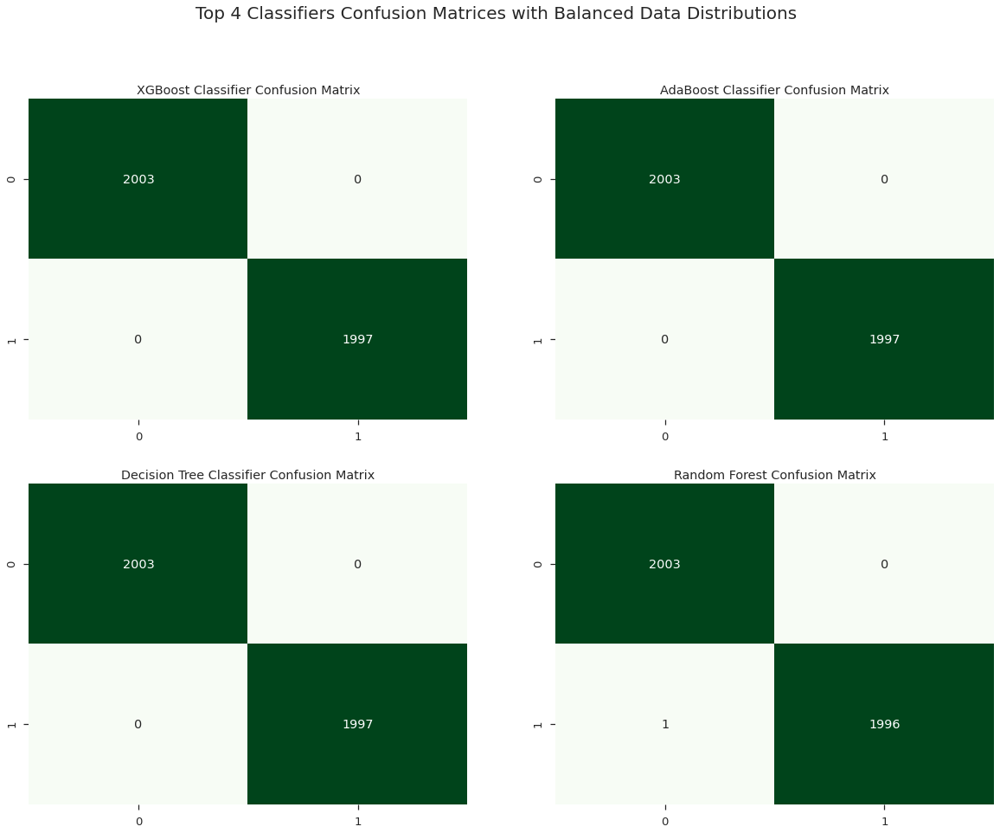

In [ ]:
plt.figure(figsize=(20,15))

plt.suptitle("Top 4 Classifiers Confusion Matrices with Balanced Data Distributions",fontsize=20)

plt.subplot(2,2,1)
plt.title("XGBoost Classifier Confusion Matrix")
sns.heatmap(cm_xgb,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,2)
plt.title("AdaBoost Classifier Confusion Matrix")
sns.heatmap(cm_adb,cbar=False,annot=True,cmap="Greens",fmt="d")

plt.subplot(2,2,3)
plt.title("Decision Tree Classifier Confusion Matrix")
sns.heatmap(cm_dt,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.subplot(2,2,4)
plt.title("Random Forest Confusion Matrix")
sns.heatmap(cm_rf,cbar=False,annot=True,cmap="Greens",fmt="d")


plt.show()

In [ ]:
#TPR = TP/(TP+FN) # FPR = FP/(FP+TN)
denominator = cm_xgb[0][0] + cm_xgb[1][0]
tpr1 = cm_xgb[0][0] /  denominator
denominator  = cm_xgb[0][1] + cm_xgb[1][1]
fpr1 =  cm_xgb[0][1] / denominator 

denominator = cm_adb[0][0] + cm_adb[1][0]
tpr2 = cm_adb[0][0] /  denominator
denominator  = cm_adb[0][1] + cm_adb[1][1]
fpr2 =  cm_adb[0][1] / denominator 

denominator = cm_dt[0][0] + cm_dt[1][0]
tpr3 = cm_dt[0][0] /  denominator
denominator  = cm_dt[0][1] + cm_dt[1][1]
fpr3 =  cm_dt[0][1] / denominator

denominator = cm_rf[0][0] + cm_rf[1][0]
tpr4 = cm_rf[0][0] /  denominator
denominator  = cm_rf[0][1] + cm_rf[1][1]
fpr4 =  cm_rf[0][1] / denominator

In [ ]:
# predict probabilities
pred_prob1 = xgb.predict_proba(x_test)
pred_prob2 = adb.predict_proba(x_test)
pred_prob3 = dt.predict_proba(x_test)
pred_prob4 = rf.predict_proba(x_test)


### Confusion Matrix Slider Dashboard

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
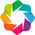

Column
    [0] Row
        [0] FloatSlider(step=0.001, value=0.001)
        [1] Markdown(str)
    [1] Row
        [0] HoloViews(Overlay)
        [1] HoloViews(Overlay)
        [2] HoloViews(Overlay)

In [ ]:
import numpy as np
import numba as nb
import holoviews as hv
import panel as pn

from matplotlib import cm

hv.extension('bokeh', 'matplotlib')
pn.extension()

pred = []
for i in range(len(pred_prob1)):
  pred.append(pred_prob1[i][1])
predarr = np.asarray(pred) 

# "Results" of a classifier
y_va_true = y_true.to_numpy()
y_va_pred = predarr
print(" ")

### helper funcs, optimized by numba ###

# generates hard predictions
@nb.njit
def pred_to_hard(val, arr):
    arr[arr > val] = 1
    arr[arr <= val] = 0
    return arr

# generates f1 score
@nb.njit
def f1_test(true, pred):
    # precision
    tp = pred[(true == 1) & (true == pred)].sum()
    pred_pos = (pred == 1).sum()
    pr = tp / pred_pos
    # recall
    actl_pos = (true == 1).sum()
    rc = tp / actl_pos
    return 2 * (pr * rc) / (pr + rc)

@nb.njit(parallel=True)
def gen_all_stats(pred, true):
    # initialize output, 1000 rows (.001 steps)
    out = np.zeros((1000,8))   
    for i in nb.prange(1000):
        cutoff = i / 1000.0
        hard = pred_to_hard(cutoff, pred.copy()).astype(np.int8)
        tp = np.sum((hard == 1) & (true == 1))
        tn = np.sum((hard == 0) & (true == 0))
        fp = np.sum((hard == 1) & (true == 0))
        fn = np.sum((hard == 0) & (true == 1))
        pr = tp / (hard == 1).sum()
        re = tp / (true == 1).sum()
        f1 = f1_test(true, hard)
        out[i] = np.array([cutoff,tp,fn,fp,tn,pr,re, f1])
       
    return out

# Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
data = gen_all_stats(y_va_pred, y_va_true)
optimal = data[np.argmax(data[:,7])]

### widgets ###
slider = pn.widgets.FloatSlider(start=0,
                                end=1,
                                step=.001, 
                                value = optimal[0])

default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
              format(*optimal[[0,7]])
md = pn.pane.Markdown(default_txt)

### layout ###
layout = pn.WidgetBox(slider, md)

### callbacks ###
def slider_update(event):
    curr_val = slider.value
    curr_idx = int(1000 * curr_val)
    f1 = data[curr_idx, 7]
    md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                     format(curr_val, f1)

### watchers ###
slider.param.watch(slider_update, 'value')


# we'll use some made up data for now
# In order, these are: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
optimal = np.array([.348,2241,754,30,16975,.9868,.7483,.8511])

# we need to use some weird indexing to get the values in the right spot
pos = [(0,1),(1,1),(0,0),(1,0)]
labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
hm_data = list(map(lambda tup,i: tup + (i,), 
                   pos, 
                   optimal[1:5].astype(int)))
label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                      pos,
                      labels,
                      optimal[1:5].astype(int)))

hm = hv.HeatMap(hm_data). \
    opts(cmap=cm.Blues,
         colorbar=False,
         xaxis='bare',
         yaxis='bare',
         height=512,
         width=512,
        )

hm*hv.Labels(label_data)

# for the AUC, we need only plot our FP vs TP
hv.Curve(data[:,[3,1]]). \
   opts(xrotation=45,
        xlabel='False Positive',
        ylabel='True Positive'
       )
# for the PR curve, we need only plot recall vs precision
hv.Curve(data[:,[6,5]]). \
   opts(xlim=(0,1),
        ylim=(0,1)
       )

class ClassificationDash():
    def __init__(self, pred, true):
        ### data ###
        self.pred = pred.copy()
        self.true = true.copy()
        # Cols: Cutoff, True Pos, False Neg, False Pos, True Neg, Precision, Recall, F1
        self.data = gen_all_stats(self.pred, self.true)
        self.init_idx = np.argmax(self.data[:,7])
        self.optimal = self.data[self.init_idx]
                
        ### widgets ###
        self.slider = pn.widgets.FloatSlider(start=0,
                                             end=1,
                                             step=.001, 
                                             value = self.optimal[0])
        default_txt = 'Cutoff @ <b>{:.3}</b> \n\n F1-Score:{:.6}'. \
                      format(*self.optimal[[0,7]])
        self.md = pn.pane.Markdown(default_txt)
        self.cm = self.gen_cm(self.optimal[1:5].astype(int))
        self.auc = self.gen_auc(self.init_idx)
        self.pr = self.gen_pr(self.init_idx)
        
        ### layout ###
        self.row_01 = pn.layout.Row(self.slider,self.md)
        self.row_02 = pn.layout.Row(self.cm, self.auc, self.pr)
        self.layout = pn.layout.Column(self.row_01,self.row_02)
        '''
        self.layout = pn.WidgetBox(self.slider, 
                                   self.md, 
                                   self.hm,
                                   self.auc,
                                   self.pr
                                  )
        '''
        ### watchers ###
        self.slider.param.watch(self.slider_update, 'value')

    ### callbacks ###
    def slider_update(self, event):
        curr_val = self.slider.value
        curr_idx = int(curr_val * 1000)
        f1 = f1_test(self.true, 
                     pred_to_hard(curr_val, self.pred.copy()))
        self.md.object = 'Cutoff @ <b>{:.3}</b>  \n\n F1-Score:{:.6}'. \
                         format(curr_val, f1)
        self.row_02[0].object = self.gen_cm(self.data[curr_idx,1:5].astype(int))
        self.row_02[1].object = self.gen_auc(curr_idx)
        self.row_02[2].object = self.gen_pr(curr_idx)
        
    ### plotting funcs: this lets us update plots ###
    def gen_cm(self, data):
        # we need to use some weird indexing to get the values in the right spot
        pos = [(0,1),(1,1),(0,0),(1,0)]
        labels = ['True Positive', 'False Negative', 'False Positive', 'True Negative']
        hm_data = list(map(lambda tup,i: tup + (i,), 
                           pos, 
                           data))
        label_data = list(map(lambda tup,lab,i: tup + ('{}\n{}'.format(lab,i),),
                              pos,
                              labels,
                              data))

        hm = hv.HeatMap(hm_data). \
            opts(cmap=cm.Blues,
                 colorbar=False,
                 xaxis='bare',
                 yaxis='bare',
                )

        return hm*hv.Labels(label_data)
    
    def gen_auc(self, curr_idx):
        # setting limits on x for readability
        x_max = self.data[:,3].max()
        x_min = -int(x_max / 20)
        plot = hv.Curve(self.data[:,[3,1]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(0,1500),
                       ylim=(0,1500)
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[3,1]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    def gen_pr(self, curr_idx):
        plot = hv.Curve(self.data[:,[6,5]]). \
                  opts(xrotation=45,
                       xlabel='False Positive',
                       ylabel='True Positive',
                       xlim=(-.01,1),
                       ylim=(0,1.01),
                      )
        marker = hv.Points(tuple(self.data[curr_idx,[6,5]])). \
                    opts(size=6,
                         color='Red'
                        )
        return plot * marker
    
    ### helper funcs ###
    
    def show(self):
        return self.layout

dash = ClassificationDash(y_va_pred, y_va_true)
dash.show()              

In [ ]:
from sklearn.metrics import roc_curve

# roc curve for models
fpr1, tpr1, thresh1 = roc_curve(y_test, pred_prob1[:,1], pos_label=1)
fpr2, tpr2, thresh2 = roc_curve(y_test, pred_prob2[:,1], pos_label=1)
fpr3, tpr3, thresh3 = roc_curve(y_test, pred_prob3[:,1], pos_label=1)
fpr4, tpr4, thresh4 = roc_curve(y_test, pred_prob4[:,1], pos_label=1)

# roc curve for tpr = fpr 
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test, random_probs, pos_label=1)

In [ ]:
from sklearn.metrics import roc_auc_score

# auc scores
auc_score1 = roc_auc_score(y_test, pred_prob1[:,1])
auc_score2 = roc_auc_score(y_test, pred_prob2[:,1])
auc_score3 = roc_auc_score(y_test, pred_prob3[:,1])
auc_score4 = roc_auc_score(y_test, pred_prob4[:,1])

print(auc_score1, auc_score2, auc_score3, auc_score4)

1.0 1.0 1.0 1.0


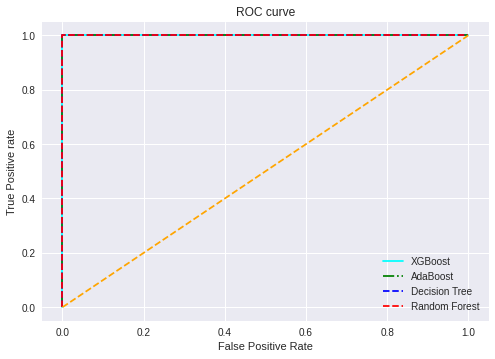

In [ ]:
# matplotlib
import matplotlib.pyplot as plt
plt.style.use('seaborn')

# plot roc curves
plt.plot(fpr1, tpr1, linestyle='-',color='cyan', label='XGBoost')
plt.plot(fpr2, tpr2, linestyle='-.',color='green', label='AdaBoost')
plt.plot(fpr3, tpr3, linestyle='--',color='blue', label='Decision Tree')
plt.plot(fpr4, tpr4, linestyle='--',color='red', label='Random Forest')
plt.plot(p_fpr, p_tpr, linestyle='--', color='orange')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show();

## **Conclusion**

### **Lessions Learnt**

**Confusion Matrix Dashboard** **:** By changing the slider of the confusion matrix dashboard, I was able to determine the F1 score that is required to minimize the False positives

Setting different thresholds for classifying positive class for data points will inadvertently change the Sensitivity and Specificity of the model. And one of these thresholds will probably give a better result than the others, depending on whether we are aiming to lower the number of False Negatives or False Positives.

The metrics change with the changing threshold values and I am able to visualize and generate different confusion matrices 

I was able to visualize the number of true positives, true negatives and the cut-off threshold value required to minimise the false positives and false negatives in the model

As I progressed with different data distributions , I have acheived the least False postives and False negatives with a balanced class and balanced data distribution

**Muller Loop :** I have acheived significantly high accuracies for all the models after balancing the classes using SMOTE technique and was able to achieve even better results with the balancing of classes and data.

**Evaluation metrics - F1 Score and Accuracy and AUC-ROC curve :** As tabularized above, I have acheived significantly better results after balancing the classes and data distributions